In [2]:
import numpy as np
import pandas as pd
import os
import re
import warnings
import io
import requests
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import plotly.express as px
from datetime import datetime, date
import folium
import json
from shapely.geometry import Point
from folium.plugins import StripePattern
import geopandas as gpd

warnings.filterwarnings("ignore")

In [733]:
# tab seperated reading of csv file
# dataset available in https://www.kaggle.com/datasets/spirospolitis/greek-weather-data.....no
df = pd.read_csv("greek_weather_data.csv",sep='\t')

In [734]:
# delete fisrt empty column
df = df.iloc[: , 1:]
# columns upper to lower 
df.columns= df.columns.str.lower()

In [738]:
# discovering the features
print("Data features are:\n")
print(df.columns.values)
print(df.isnull().sum())

Data features are:

['station_region' 'station_name' 'year' 'month' 'day' 'mean_temp'
 'high_temp' 'high_temp_time' 'low_temp' 'low_temp_time' 'heat_deg_days'
 'cool_deg_days' 'rain' 'avg_wind_speed' 'highest_wind_speed'
 'highest_wind_speed_time' 'wind_dir' 'elevation' 'lat' 'long' 'lat_deg'
 'long_deg']


In [739]:
# banded elevation
bins = [0, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000, 2200, 2400]
df['elevation_band'] = pd.cut(df['elevation'], bins)
df = df.astype({"elevation_band": object})

In [741]:
# information about our data
df.describe()
df.info()

,year,month,mean_temp,high_temp,low_temp,heat_deg_days,cool_deg_days,rain,avg_wind_speed,highest_wind_speed,elevation,lat_deg,long_deg
count,921561.000000,921561.000000,920443.000000,920382.00000,920444.000000,919463.000000,919432.000000,917910.000000,918161.000000,918227.000000,751374.000000,751374.000000,751374.000000
mean,2014.176186,6.665575,16.193187,20.81436,12.069061,29.018131,17.618557,2.138916,6.542738,31.301103,306.187399,38.451035,23.035251
std,2.924263,3.449229,7.602937,8.34036,7.398530,37.295441,24.806338,7.620012,6.185780,14.818907,410.431142,1.716364,2.045653
min,2006.000000,1.000000,-62.500000,-15.90000,-67.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,27.947222,12.100000
25%,2012.000000,4.000000,10.900000,14.90000,7.100000,0.900000,0.000000,0.000000,2.400000,20.900000,20.000000,37.666667,21.650000
50%,2015.000000,7.000000,16.200000,20.70000,12.200000,7.000000,3.500000,0.000000,4.800000,29.000000,107.000000,38.400000,22.958889
75%,2017.000000,10.000000,22.300000,27.50000,17.600000,75.000000,36.000000,0.200000,8.500000,38.600000,511.000000,39.618889,24.000000
max,2018.000000,12.000000,73.800000,82.40000,67.300000,213.400000,100.000000,417.200000,90.600000,222.100000,2245.000000,43.000000,35.500000


### Cleaning the data

In [742]:
# drop wrong values no date
df.drop(df[df['day'] == 'DAY'].index, inplace = True)

In [743]:
df['day'] = pd.to_numeric(df['day'])

In [744]:
# drop wrong values and wrong dates
df.drop(df.iloc[103974].name, inplace = True)
df.drop(df.iloc[198850].name, inplace = True)
df.drop(df.iloc[263193].name, inplace = True)
df.drop(df.iloc[475589].name, inplace = True)
df.drop(df.iloc[475614].name, inplace = True)
df.drop(df.iloc[475614].name, inplace = True)
df.drop(df.iloc[475614].name, inplace = True)
df.drop(df.iloc[571713].name, inplace = True)
df.drop(df.iloc[571866].name, inplace = True)
df.drop(df.iloc[573739].name, inplace = True)
df.drop(df.iloc[616674].name, inplace = True)
df.drop(df.iloc[667302].name, inplace = True)
df.drop(df.iloc[723026].name, inplace = True)

# drop wrong temperatures
df.drop(df[df['low_temp']<-20][df['station_region']=='Ήπειρος'].index, inplace = True)
df.drop(df[df['low_temp']<-20][df['station_region']=='Θεσσαλία'].index, inplace = True)
df.drop(df[df['low_temp']<-20][df['station_region']=='Κρήτη'].index, inplace = True)

# cut below 40 degrees
df.drop(df[df['low_temp'] < -40].index, inplace = True)
df.drop(df[df['low_temp'] >40].index, inplace = True)

# extremely high temperatures
df.drop(df[df['high_temp']>60].index, inplace = True)
df.drop(df[df['high_temp']>30][df['month']==1].index, inplace = True)
df.drop(df[df['high_temp']>30][df['month']==2].index, inplace = True)
# extremely high low_temperatures for first 2 months
df.drop(df[df['low_temp']>20][df['month']==1].index, inplace = True)
df.drop(df[df['low_temp']>20][df['month']==2].index, inplace = True)

# strange phenomenon in a 'hole'
df.drop(df[df['station_name']=='Κεχρωτή Αρκαδίας'].index, inplace = True)

# extremely high temperatures differences in a day
df.drop(df[(df['high_temp']-df['low_temp'])>30].index, inplace = True)

In [745]:
# change wrong latitude & longitude (lots of wrong coordinates)
df.loc[df['station_name'] == "Τζερμιάδων", "lat_deg"] = 35.199162
df.loc[df['station_name'] == "Τζερμιάδων", "long_deg"] = 25.489260
df.loc[df['station_name'] == "Μεγίστη Λαύρα", "lat_deg"] = 40.170774
df.loc[df['station_name'] == "Μεγίστη Λαύρα", "long_deg"] = 24.382790
df.loc[df['station_name'] == "Υμηττός - Δάφνη", "lat_deg"] = 37.950626 
df.loc[df['station_name'] == "Υμηττός - Δάφνη", "long_deg"] = 23.734425
df.loc[df['station_name'] == "Κοίμηση Σερρών", "lat_deg"] = 41.212902
df.loc[df['station_name'] == "Κοίμηση Σερρών", "long_deg"] = 23.301081
df.loc[df['station_name'] == "Αράχωβα", "lat_deg"] = 38.480856
df.loc[df['station_name'] == "Αράχωβα", "long_deg"] = 22.584744
df.loc[df['station_name'] == "Πατήσια", "lat_deg"] = 38.020730
df.loc[df['station_name'] == "Πατήσια", "long_deg"] = 23.732532
df.loc[df['station_name'] == "Κερατέα Αττικής", "lat_deg"] = 37.807399
df.loc[df['station_name'] == "Κερατέα Αττικής", "long_deg"] = 23.977708
df.loc[df['station_name'] == "Κριεζά Ευβοίας", "lat_deg"] = 38.397011
df.loc[df['station_name'] == "Κριεζά Ευβοίας", "long_deg"] = 24.136510
df.loc[df['station_name'] == "Κιλκίς", "lat_deg"] = 40.993255
df.loc[df['station_name'] == "Κιλκίς", "long_deg"] = 22.875473
df.loc[df['station_name'] == "Νεοχώρι Άρτας", "lat_deg"] = 39.069802
df.loc[df['station_name'] == "Νεοχώρι Άρτας", "long_deg"] = 21.022729
df.loc[df['station_name'] == "Σπήλι Ρεθύμνου", "lat_deg"] = 35.218131
df.loc[df['station_name'] == "Σπήλι Ρεθύμνου", "long_deg"] = 24.535297
df.loc[df['station_name'] == "Παναγούλα Ζακύνθου", "lat_deg"] = 37.769405
df.loc[df['station_name'] == "Παναγούλα Ζακύνθου", "long_deg"] = 20.900191
df.loc[df['station_name'] == "Κάβος Μαλέα", "lat_deg"] = 36.448957 
df.loc[df['station_name'] == "Κάβος Μαλέα", "long_deg"] = 23.201009
df.loc[df['station_name'] == "Βέροια-Μακροχώρι", "lat_deg"] = 40.551338
df.loc[df['station_name'] == "Βέροια-Μακροχώρι", "long_deg"] = 22.249524
df.loc[df['station_name'] == "Αμφίκλεια - Πόλη", "lat_deg"] = 38.639664 
df.loc[df['station_name'] == "Αμφίκλεια - Πόλη", "long_deg"] = 22.592213
df.loc[df['station_name'] == "Ανάβυσσος", "lat_deg"] = 37.735420
df.loc[df['station_name'] == "Ανάβυσσος", "long_deg"] = 23.943562
df.loc[df['station_name'] == "Γαλαξίδι", "lat_deg"] = 38.376508
df.loc[df['station_name'] == "Γαλαξίδι", "long_deg"] = 22.381549
df.loc[df['station_name'] == "Δερβένι Κορινθίας	", "lat_deg"] = 38.134273
df.loc[df['station_name'] == "Δερβένι Κορινθίας	", "long_deg"] = 22.428602
df.loc[df['station_name'] == "Ιθάκη", "lat_deg"] = 38.426684
df.loc[df['station_name'] == "Ιθάκη", "long_deg"] = 20.676671
df.loc[df['station_name'] == "Ιος", "lat_deg"] = 36.723286
df.loc[df['station_name'] == "Ιος", "long_deg"] = 25.280893
df.loc[df['station_name'] == "Κατάκολο Ηλείας", "lat_deg"] = 37.655120
df.loc[df['station_name'] == "Κατάκολο Ηλείας", "long_deg"] = 21.317596
df.loc[df['station_name'] == "Κρανίδι Αργολίδας", "lat_deg"] = 37.380009
df.loc[df['station_name'] == "Κρανίδι Αργολίδας", "long_deg"] = 23.159924
df.loc[df['station_name'] == "Μαρίνα Αθηνών", "lat_deg"] = 37.942542
df.loc[df['station_name'] == "Μαρίνα Αθηνών", "long_deg"] = 23.670607
df.loc[df['station_name'] == "Νάξος", "lat_deg"] = 37.100791
df.loc[df['station_name'] == "Νάξος", "long_deg"] = 25.380131
df.loc[df['station_name'] == "Πάτμος", "lat_deg"] = 37.312498
df.loc[df['station_name'] == "Πάτμος", "long_deg"] = 26.547377
df.loc[df['station_name'] == "Παλαιόχωρα", "lat_deg"] = 35.228064
df.loc[df['station_name'] == "Παλαιόχωρα", "long_deg"] = 23.680900
df.loc[df['station_name'] == "Πορταριά Πηλίου", "lat_deg"] = 39.389235
df.loc[df['station_name'] == "Πορταριά Πηλίου", "long_deg"] = 22.999000
df.loc[df['station_name'] == "Ρωμανός Πατρών", "lat_deg"] = 38.228466
df.loc[df['station_name'] == "Ρωμανός Πατρών", "long_deg"] = 21.791219
df.loc[df['station_name'] == "Σάμος (Καρλόβασι)", "lat_deg"] = 37.794372
df.loc[df['station_name'] == "Σάμος (Καρλόβασι)", "long_deg"] = 26.703073
df.loc[df['station_name'] == "Σαλαμίνα", "lat_deg"] = 37.966537
df.loc[df['station_name'] == "Σαλαμίνα", "long_deg"] = 23.491546
df.loc[df['station_name'] == "Τήνος", "lat_deg"] = 37.541841
df.loc[df['station_name'] == "Τήνος", "long_deg"] = 25.163923
df.loc[df['station_name'] == "Ταξιάρχης (Μανταμάδος)", "lat_deg"] = 39.316817
df.loc[df['station_name'] == "Ταξιάρχης (Μανταμάδος)", "long_deg"] = 26.339172
df.loc[df['station_name'] == "Χανιά", "lat_deg"] = 35.514688
df.loc[df['station_name'] == "Χανιά", "long_deg"] =24.021118

In [747]:
# finding day of the year from 1 to 365/366
df["day_of_year"] = ' '
def compute_day(row):
    day_of_year = date(row[2],row[3],row[4]).timetuple().tm_yday
    return day_of_year

df['day_of_year'] = df.apply(compute_day, axis=1)

In [748]:
# exporting dataset of csv file
df.to_csv('new_weather_data.csv', sep='\t', encoding='utf-8', index=False )

### Importing the new data


In [6]:
# tab seperated reading
df = pd.read_csv("new_weather_data.csv",sep='\t')

### Data visualization

In [50]:
def bar_plot(feature1,feature2):
    plt.figure(figsize = (9,4))
    sns.barplot(data = df , x = feature1 , y = feature2).set_title(f"{feature1} Vs {feature2}")
    plt.show()
def bar_plot_2(feature1,feature2):
    plt.figure(figsize = (6,4))
    sns.barplot(data = df , x = feature1 , y = feature2).set_title(f"{feature1} Vs {feature2}")
    plt.show()
def bar_plot_3(feature1,feature2):
    plt.figure(figsize = (18,4))
    df_ordered = df.sort_values('elevation')
    sns.barplot(data = df_ordered , x = feature1 , y = feature2).set_title(f"{feature1} Vs {feature2}")
    plt.show()

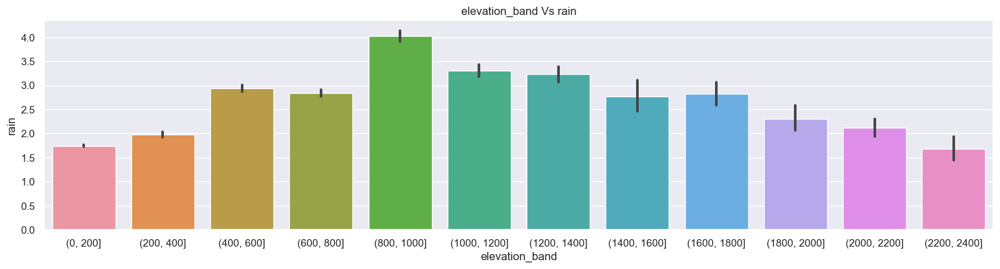

In [98]:
bar_plot_3('elevation_band','rain')

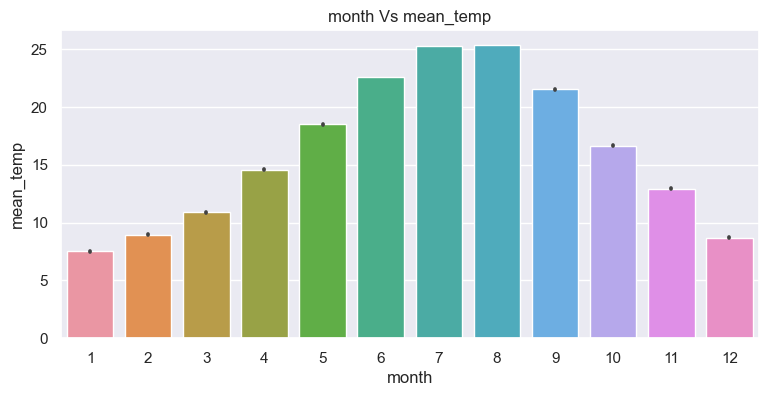

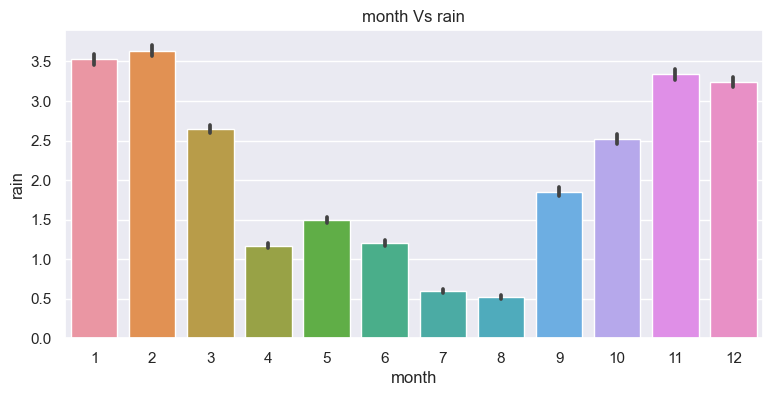

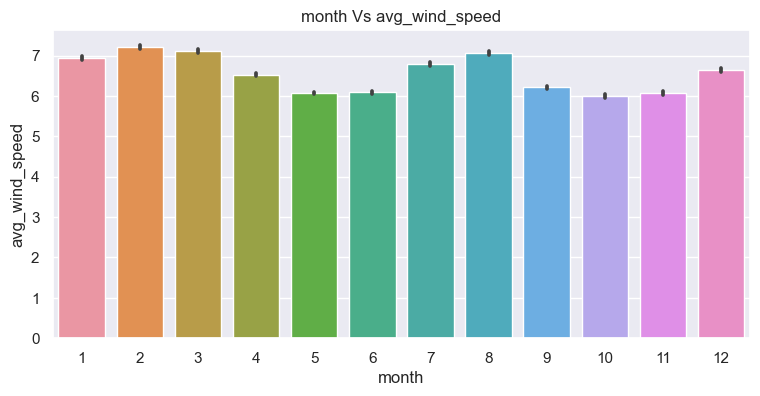

In [99]:
bar_plot('month','mean_temp')
bar_plot('month','rain')
bar_plot('month','avg_wind_speed')

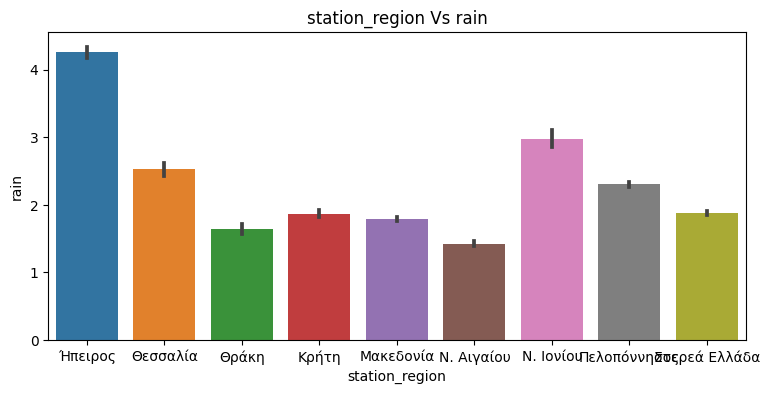

In [53]:
bar_plot('station_region','rain')

<AxesSubplot: >

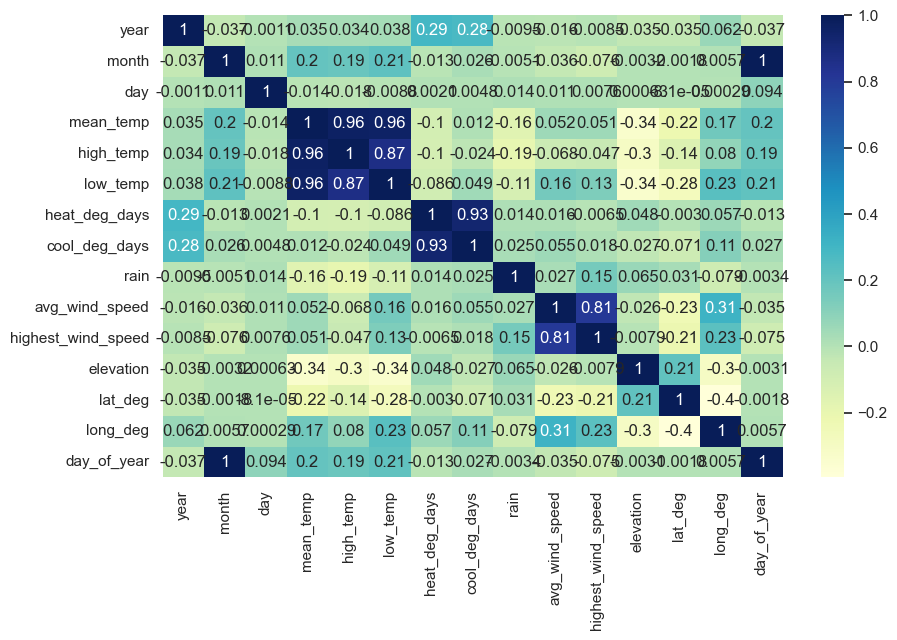

In [54]:
# discovering the correlations
sns.set(rc = {'figure.figsize':(10,6)})
sns.heatmap(df.corr(), annot = True, fmt='.2g',cmap= 'YlGnBu')

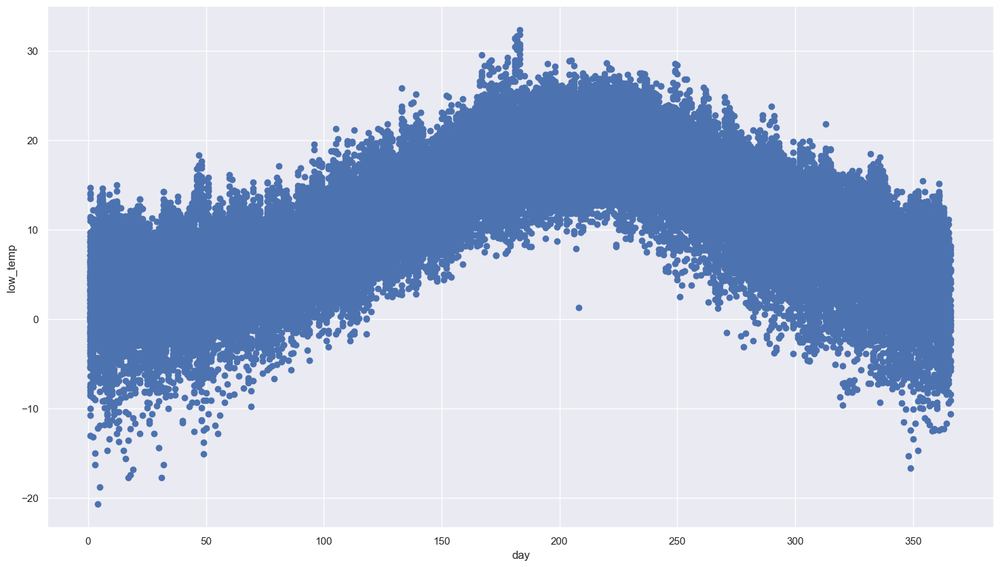

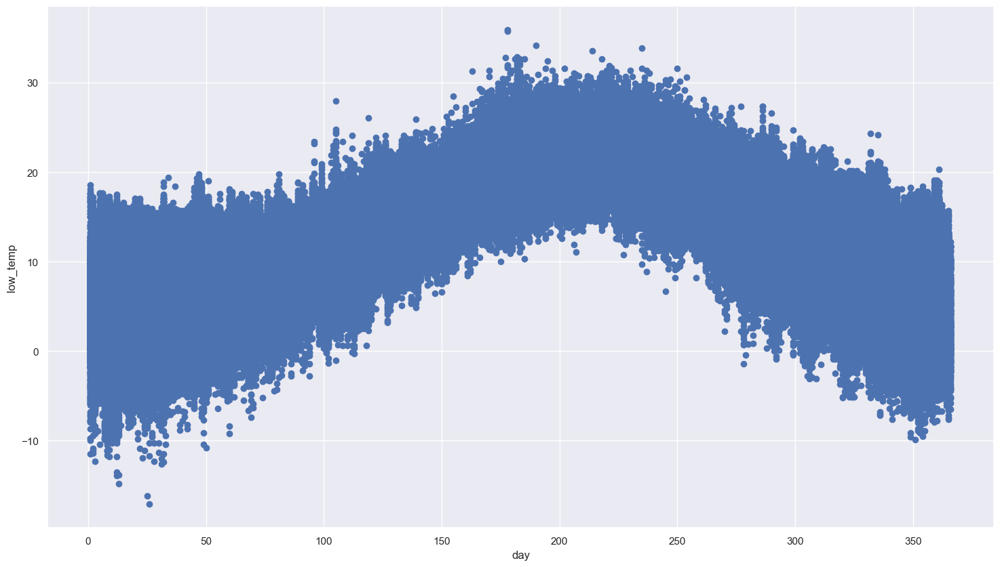

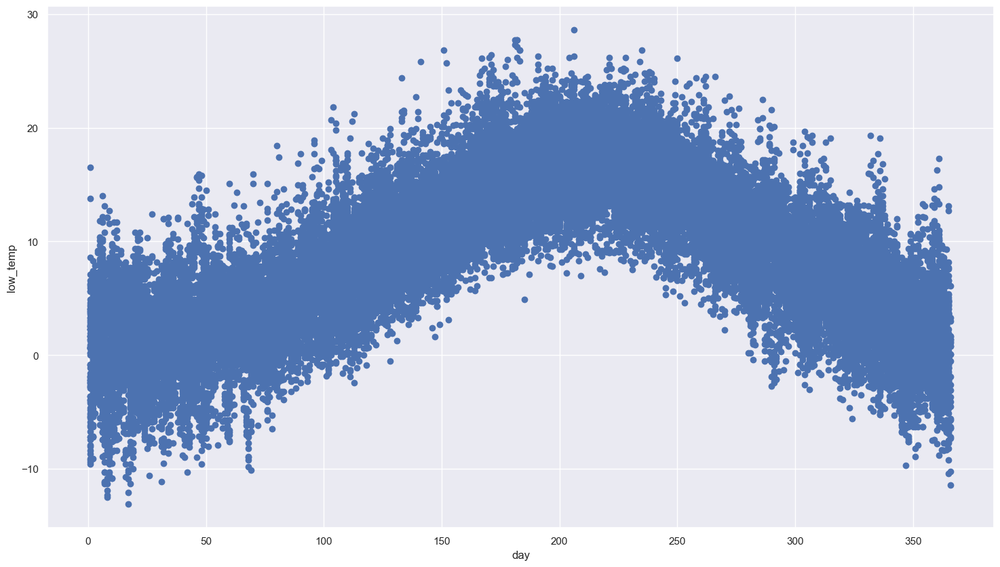

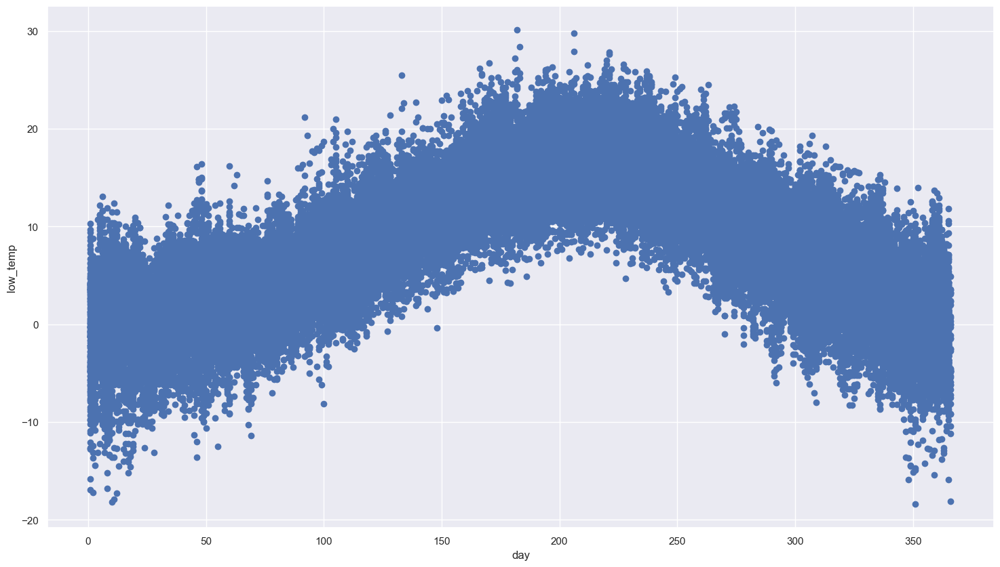

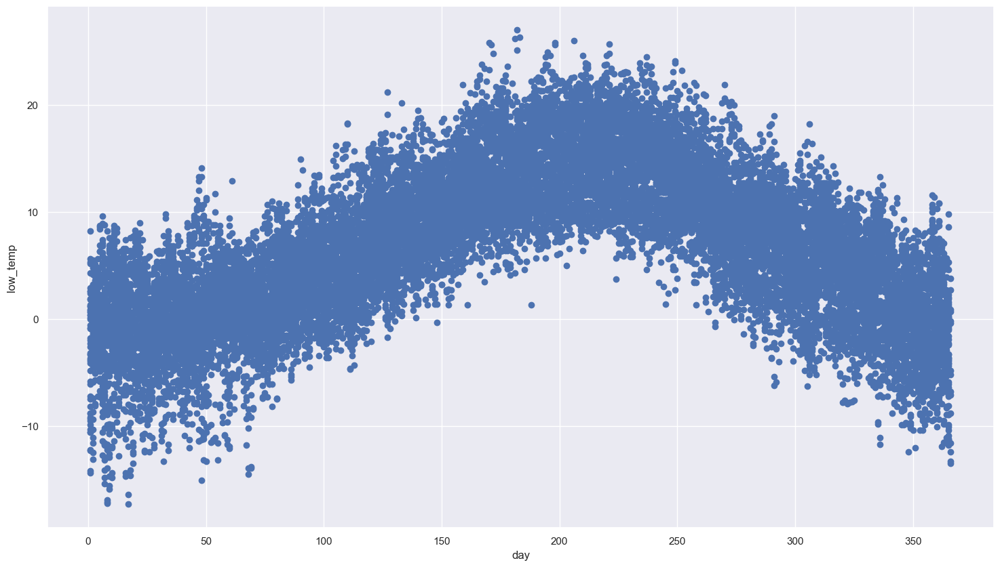

...

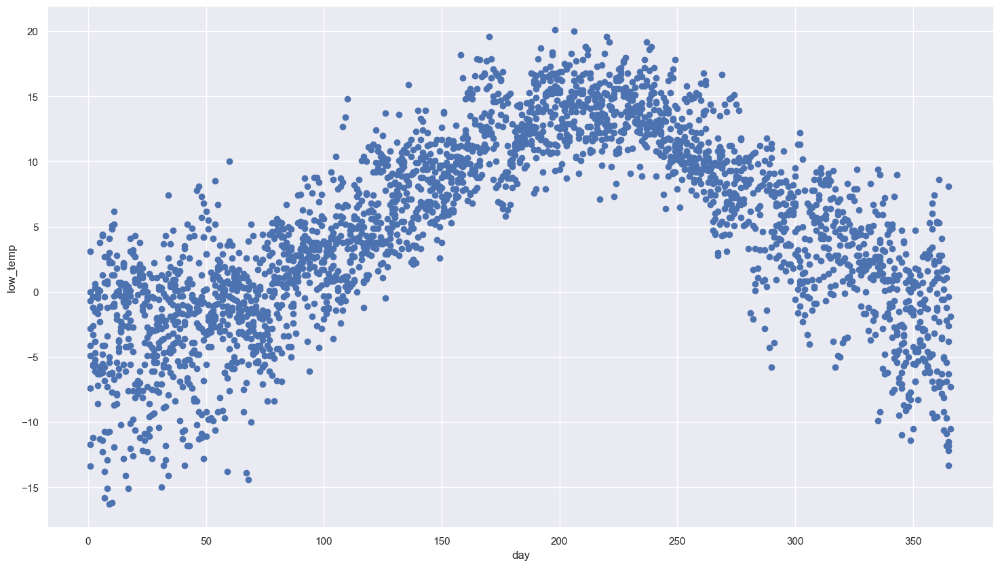

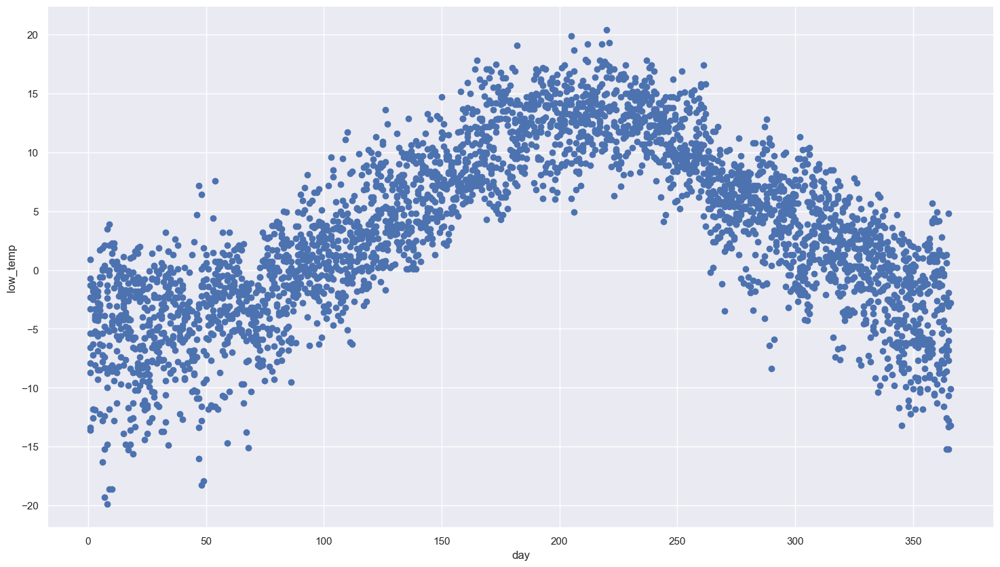

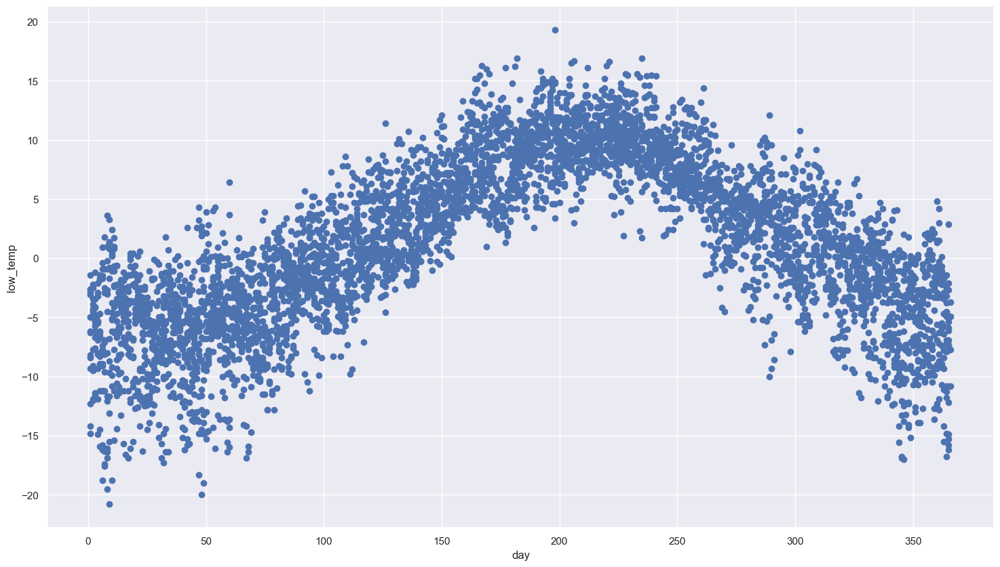

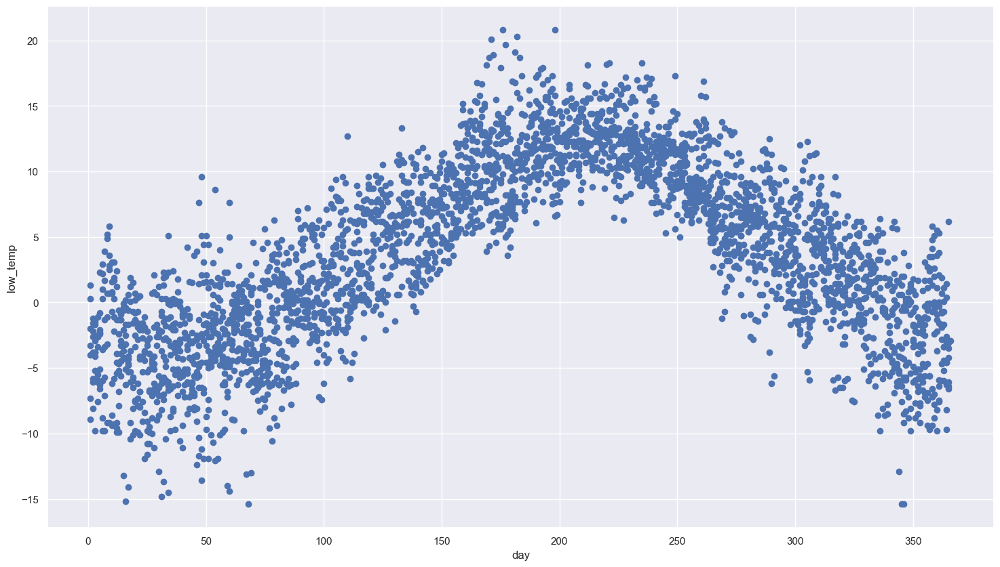

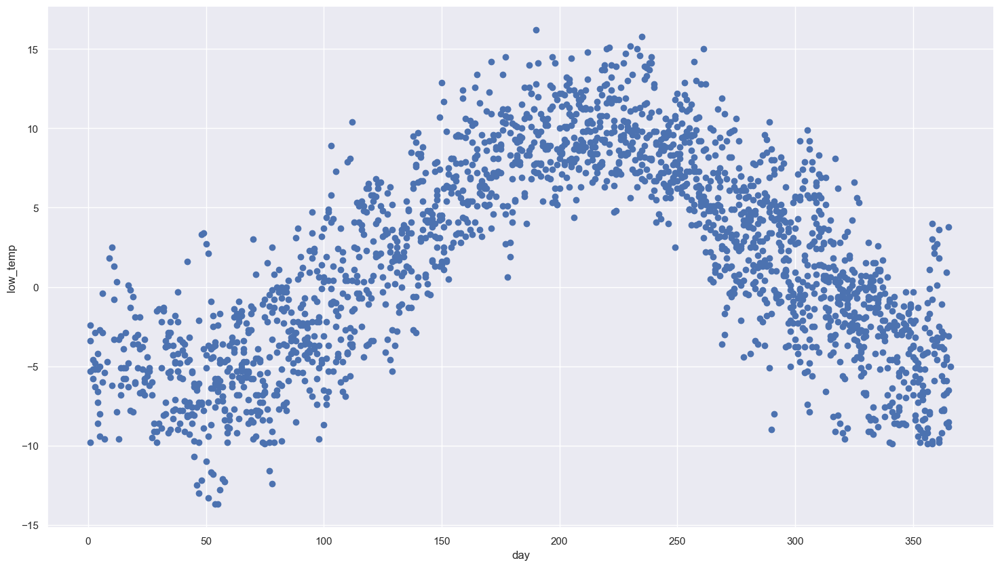

In [55]:
# day of the year/ elevation band/ low temperature
bands = df['elevation_band'].unique()

for band in bands:
    # scatter plot
    fig, ax = plt.subplots(figsize = (18,10))
    ax.scatter(df['day_of_year'][df['elevation_band']==band],df['low_temp'][df['elevation_band']==band])

    # x-axis label
    ax.set_xlabel('day')

    # y-axis label
    ax.set_ylabel('low_temp')
    plt.show()

In [ ]:
# amount of information per region
df.groupby(['station_region'])['station_region'].count().sort_values(ascending=False) 

station_region
Στερεά Ελλάδα    225711
Μακεδονία        154084
Πελοπόννησος     152887
Ν. Αιγαίου       124648
Κρήτη             99857
Ήπειρος           84745
Θεσσαλία          42392
Θράκη             20031
Ν. Ιονίου         17107
Name: station_region, dtype: int64

In [56]:
# maximum lower temperature per region
regions = df['station_region'].unique()

for region in regions:
    print(region)
    print(df["low_temp"][df['station_region']== region].max())

Ήπειρος
33.6
Θεσσαλία
32.3
Θράκη
28.2
Κρήτη
35.8
Μακεδονία
31.1
Ν. Αιγαίου
32.7
Ν. Ιονίου
31.1
Πελοπόννησος
35.9
Στερεά Ελλάδα
34.2


In [58]:
# most info collected per station
df.groupby("station_name").size().sort_values(ascending=False)

station_name
Χανιά                    4717
Πτολεμαΐδα               4641
Ηράκλειο                 4588
Ορεστιάδα                4539
Πολύγυρος                4504
                         ... 
ΔΕΘ                        61
Σταλός Χανίων              61
Βαθιά Λογγά Φθιώτιδας      31
Στύψη Λέσβου               31
Θερμά Σερρών               31
Length: 409, dtype: int64

In [ ]:
# most info collected per region
df.groupby("station_region").size().sort_values(ascending=False)

station_region
Στερεά Ελλάδα    225702
Μακεδονία        154079
Πελοπόννησος     150472
Ν. Αιγαίου       124642
Κρήτη             99846
Ήπειρος           84696
Θεσσαλία          42388
Θράκη             20031
Ν. Ιονίου         17107
dtype: int64

In [59]:
df_rain = pd.DataFrame(columns=['Region', 'Month','Rain in mm'])

In [60]:
# information about rainfall per regions in months
regions = df['station_region'].unique()

for region in regions:
    for i in range(1,13):
        rain = (round((df[df['station_region']==region][df['month']==i].mean().rain),1))
        df_rain = df_rain.append({'Region' : region, 'Month' : i, 'Rain in mm' : rain}, ignore_index = True)

In [66]:
def top_rain_stat(reg):
    return   df[df['station_region']==reg].groupby(['station_name','month'])['rain'].agg(['mean', 'count']).sort_values('mean',ascending=False).head()

In [68]:
# stats per day over the years
# metric equals to the available features that we have
def stats(metric):
    for y in range(2006,2018):
        # scatter plot
        fig, ax = plt.subplots(figsize = (18,10))
        ax.scatter(df['day_of_year'][df['year']==y],df[metric][df['year']==y])

        # x-axis label
        ax.set_xlabel('day')
        # y-axis label
        ax.set_ylabel(metric)
        plt.show()

    

In [ ]:
#create a histogram
fig = px.histogram(df, x='rain')
fig.show()

### MAPS visualization

In [7]:
# import geodata for greek municipalities
# http://www.diva-gis.org/
fp = "GRC_adm3.shp"
map_df2 = gpd.read_file(fp)

In [8]:
# keep the useful data
map_df2 = map_df2[['ID_3','geometry','NL_NAME_3']]

In [9]:
# fall and winter months (we can choose between months or specific periods)
df_select = df[(df['month'] >= 9) | (df['month'] <= 2)]

In [10]:
# keep the useful data
df_select = df_select.groupby(['station_name','lat_deg','long_deg'])['rain','mean_temp'].agg(['mean']).reset_index()

In [11]:
# rename columns
df_select.rename(columns = {'rain':'mean_rain','mean_temp':'mean_temp',}, inplace = True)
# drop unnecessary mutlindexing 
df_select.columns = df_select.columns.droplevel(1)

In [12]:
# match every coordinate of station to a certain region/municipality 
def matching(row):
    p1 = Point(map(float,((row['long_deg'], row['lat_deg']))))
    ind = map_df2['ID_3'][map_df2['geometry'].contains(p1)].tolist()
    if len(ind) != 0:
        return ind[0]
    else:
        return None
df_select['id'] = df_select.apply(lambda row: matching(row), axis=1)


In [13]:
# drop any values that didn't match a (mutli)poligon that follium can't handle
df_select = df_select.dropna()

In [14]:
# dropping the old coordinates we don't need
df_select = df_select[['mean_rain','mean_temp','id']]

In [15]:
# change the datatype of ids from float to int 
df_select.id = df_select.id.astype(int)

In [16]:
# grouping stations that belong to the same region/municipality
df_select = df_select.groupby(['id'])['mean_rain','mean_temp'].agg(['mean']).reset_index()

In [17]:
# drop unnecessary mutlindexing 
df_select.columns = df_select.columns.droplevel(1)

In [18]:
# rename column
map_df2 = map_df2.rename(columns={'ID_3': 'id'})

In [19]:
# merging the two dataframes
final_df = pd.merge(map_df2,df_select, on='id', how='outer')

In [20]:
# creating a map
# type of map and starting position
sample_map2 = folium.Map(location=[38,25], tiles="cartodbpositron", zoom_start=6)
fg1 = folium.FeatureGroup(name='Mean Rain',overlay=False).add_to(sample_map2)
fg2 = folium.FeatureGroup(name='Mean Temperature',overlay=False).add_to(sample_map2)

In [21]:
# add the first choropleth map layer to fg1
# available scaling for data 
#   custom_scale1 = (final_df['mean_rain'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
rain=folium.Choropleth(
            geo_data= final_df,
            data= final_df,
            columns=['NL_NAME_3',"mean_rain"],  
            key_on="feature.properties.NL_NAME_3",
            #threshold_scale=custom_scale1,
            fill_color='YlGnBu',
            nan_fill_color="Grey", # grey color if there is no data available 
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name='Average rainfall',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg1)

# add customized tooltips to the map
folium.features.GeoJson(
                    data=final_df,
                    name='Average rainfall',
                    smooth_factor=0,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['NL_NAME_3','mean_rain'],
                        aliases=["Νame of municipality:",
                                 "Average rainfall:",
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 1px solid black;
                            border-radius: 2px;
                            box-shadow: 2px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(rain) 

In [22]:
# add the second choropleth map layer to fg2
# available scaling for data 
#   custom_scale2 = (final_df['mean_temp'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()
temp=folium.Choropleth(
            geo_data= final_df,
            data= final_df,
            columns=['NL_NAME_3',"mean_temp"],  
            key_on="feature.properties.NL_NAME_3",
            #threshold_scale=custom_scale2,
            fill_color='YlOrRd',
            nan_fill_color="Grey",
            fill_opacity=0.7,
            line_opacity=0.2,
            legend_name='Average temperature',
            highlight=True,
            overlay=False,
            line_color='black').geojson.add_to(fg2)

# add customized tooltips to the map when hovering over
folium.features.GeoJson(
                    data=final_df,
                    name='Average temperature',
                    smooth_factor=0,
                    style_function=lambda x: {'color':'black','fillColor':'transparent','weight':0.5},
                    tooltip=folium.features.GeoJsonTooltip(
                        fields=['NL_NAME_3','mean_temp'],
                        aliases=["Νame of municipality:",
                                 "Average temperature:",
                                ], 
                        localize=True,
                        sticky=False,
                        labels=True,
                        style="""
                            background-color: #F0EFEF;
                            border: 1px solid black;
                            border-radius: 2px;
                            box-shadow: 2px;
                        """,
                        max_width=800,),
                            highlight_function=lambda x: {'weight':3,'fillColor':'grey'},
                        ).add_to(temp) 

In [23]:
# add layer controls settings to the map
folium.TileLayer('cartodbdark_matter',overlay=True,name="View in Dark Mode").add_to(sample_map2)
folium.TileLayer('cartodbpositron',overlay=True,name="View in Light Mode").add_to(sample_map2)
folium.LayerControl(collapsed=False).add_to(sample_map2)
sample_map2
# saving map to a file
sample_map2.save("MAP2.html")